# Dimensionality reduction with TSNE for Google's video codec seed. Testing different metrics

In [1]:
#TODO: remove after development 
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

pd.set_option('display.max_columns', 5400)

from fiz_lernmodule import data_reader
from fiz_lernmodule.visualization_landscaping import EmbeddingVisualizer

## Loading data

In [4]:
seed_name = 'video_codec'
src_dir = "."

landscape_reader = data_reader.LandscapeDataReader(src_dir=src_dir)
patents = landscape_reader.load_data(seed_name=seed_name)

Loading data from .\data\video_codec\landscape_data.pkl
Finished loading.


In [5]:
print(patents.shape)
#patents.head()

(10932, 12)


In [6]:
final_layer = pd.read_csv(src_dir + '/data/' + seed_name + '/final_layer_embedding.csv')
final_layer.set_index("Unnamed: 0", inplace=True)

print(final_layer.shape)
#final_layer.head()

(10932, 64)


In [7]:
average_word = pd.read_csv(src_dir + '/data/' + seed_name + '/average_word_embedding.csv')
average_word.set_index("Unnamed: 0", inplace=True)

print(average_word.shape)
#average_word.head()

(10932, 300)


## Preprocessing of text from abstract to labels with TF-IDF

In [8]:
patents_seed = patents.loc[patents['ExpansionLevel'] == 'Seed']
patents_seed["abstract_prep"] = patents_seed["title_text"].str.cat(patents_seed["abstract_text"], sep=" ")
print(patents_seed.shape)
patents_seed.head()

(1630, 13)


C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,pub_num,publication_number,country_code,family_id,priority_date,title_text,abstract_text,refs,cpcs,ipcs,assignees_harmonized,ExpansionLevel,abstract_prep
5,7936823,US-7936823-B2,US,30112744,20020715,Moving picture encoding method and decoding me...,"A moving picture decoding method, which genera...","US-2004028282-A1,US-2004001546-A1,JP-200404871...","H04N19/44,H04N19/573,H04N19/70,H04N19/109,H04N...","H04N19/51,H04N11/04,H04N19/12,H04N11/02,H04N19...",HITACHI CONSUMER ELECTRONICS,Seed,Moving picture encoding method and decoding me...
11,6785331,US-6785331-B1,US,12301906,19970214,Predictive encoding and decoding methods of vi...,Video data predictive encoding methods using t...,",JP-H08140098-A,US-5764803-A,JP-H02171093-A,EP...","H04W52/30,G06F2221/2105,H04L65/1006,H04L25/490...","H04N9/64,H04H60/72,H04N5/66,H04N7/52,C07C69/82...",NIPPON TELEGRAPH & TELEPHONE,Seed,Predictive encoding and decoding methods of vi...
12,8189658,US-8189658-B2,US,32089632,20021010,Video-information encoding method and video-in...,A video-information encoding apparatus and dec...,"JP-H10191343-A,US-6256415-B1,JP-H02248179-A,CA...","H04N19/13,H04N19/156,H04N19/174,H04N19/12,H04N...","H04N19/503,H04N19/46,H04N19/61,H04N19/176,H04N...","YAGASAKI YOICHI,SONY CORP,SUNOHARA OSAMU,MURAY...",Seed,Video-information encoding method and video-in...
22,9712824,US-9712824-B2,US,48191357,20111104,Method of deriving quantization parameter with...,A method of inversely quantizing a quantized b...,"WO-2009105732-A1,US-2012320971-A1,US-201301677...","H04N19/105,H04N19/126,H04N19/157,H04N19/176,H0...","H04N19/136,H04N19/105,H04N19/70,H04N19/593,H04...",INFOBRIDGE PTE LTD,Seed,Method of deriving quantization parameter with...
23,8325806,US-8325806-B2,US,34808119,20040130,Video frame encoding and decoding,A video frame arithmetical context adaptive en...,"US-6411231-B1,US-6980596-B2,US-6677868-B2,US-6...","H04N19/112,H04N19/61,H04N19/16,H04N19/13,H04N1...","H04N7/12,H04N11/04,H04N7/50,H04N7/26,H04N11/02","WIEGAND THOMAS,MARPE DETLEV,FRAUNHOFER GES FOR...",Seed,Video frame encoding and decoding A video fram...


In [9]:
from fiz_lernmodule.preprocessing import PreProcessor

pre = PreProcessor()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tskripnikova\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [10]:
patents_seed['terms'] = patents_seed['abstract_text'].map(lambda patent: pre.preprocess_text(patent).split())
print(patents_seed.shape)
#patents_seed.head()

(1630, 14)


C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [11]:
import gensim

dictionary = gensim.corpora.Dictionary(patents_seed['terms'] )
#dictionary.token2id

C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


### Document to Bag-of-word

In [12]:
bow_corpus = [dictionary.doc2bow(doc) for doc in patents_seed['terms'] ]

# Preview Bag Of Words for a sample document
bow_doc_0 = bow_corpus[0]
for i in range(len(bow_doc_0)):
    print("Word {} \"{}\" appears {} times.".format(bow_doc_0[i][0], dictionary[bow_doc_0[i][0]], bow_doc_0[i][1]))

Word 0 "adjac" appears 1 times.
Word 1 "among" appears 1 times.
Word 2 "base" appears 1 times.
Word 3 "block" appears 3 times.
Word 4 "candid" appears 2 times.
Word 5 "current" appears 1 times.
Word 6 "decod" appears 4 times.
Word 7 "direct" appears 1 times.
Word 8 "frame" appears 3 times.
Word 9 "gener" appears 2 times.
Word 10 "imag" appears 3 times.
Word 11 "includ" appears 3 times.
Word 12 "inform" appears 6 times.
Word 13 "left" appears 1 times.
Word 14 "mode" appears 5 times.
Word 15 "motion" appears 6 times.
Word 16 "move" appears 3 times.
Word 17 "multipl" appears 1 times.
Word 18 "perform" appears 2 times.
Word 19 "pictur" appears 3 times.
Word 20 "predict" appears 8 times.
Word 21 "refer" appears 3 times.
Word 22 "referenc" appears 1 times.
Word 23 "select" appears 5 times.
Word 24 "side" appears 2 times.
Word 25 "upper" appears 1 times.
Word 26 "vector" appears 6 times.
Word 27 "whether" appears 1 times.
Word 28 "without" appears 1 times.


### Creating TfidfModel

In [13]:
from pprint import pprint

tfidf = gensim.models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]

for doc in corpus_tfidf:
    #pprint(doc)
    break

In [14]:
from operator import itemgetter

for i, doc in enumerate(corpus_tfidf):
    doc.sort(key=itemgetter(1), reverse=True)
    sorted_words = []
    for word_id, relevance in doc:
        sorted_words.append(dictionary[word_id])
        #print(dictionary[word_id] + " " + str(word_id) + " " + str(relevance)) 
    patents_seed.iat[i, 12] = sorted_words # replace label with a sorted list
    
#patents_seed.head()

In [15]:
final_layer_seed = final_layer.merge(patents_seed, left_index=True, right_index=True)
final_layer_seed = final_layer_seed.loc[final_layer_seed['ExpansionLevel'] == 'Seed']
final_layer_seed.drop(final_layer_seed.columns[64:], axis=1, inplace=True)
#print(final_layer_seed.shape)
#final_layer_seed.head()

In [16]:
average_word_seed = average_word.merge(patents_seed, left_index=True, right_index=True)
average_word_seed = average_word_seed.loc[average_word_seed['ExpansionLevel'] == 'Seed']
average_word_seed.drop(average_word_seed.columns[300:], axis=1, inplace=True)
#print(average_word_seed.shape)
#average_word_seed.head()

## Trying out TSNE with different parameters

Supported distance metrics:

In [17]:
import sklearn.neighbors

metrics = sorted(sklearn.neighbors.VALID_METRICS['brute'])

In [18]:
#metrics that require additional parameters
metrics.remove('precomputed')
metrics.remove('mahalanobis')
metrics.remove('seuclidean')
metrics.remove('wminkowski')
metrics.remove('yule')

#metrics that always result in an unhelpful visual
metrics.remove('dice')
metrics.remove('hamming')
metrics.remove('jaccard')
metrics.remove('kulsinski')
metrics.remove('matching')
metrics.remove('rogerstanimoto')
metrics.remove('russellrao')
metrics.remove('sokalmichener')
metrics.remove('sokalsneath')

#cosine is twice in the list, remove one
metrics.remove('cosine')

metrics

['braycurtis',
 'canberra',
 'chebyshev',
 'cityblock',
 'correlation',
 'cosine',
 'cosine',
 'euclidean',
 'l1',
 'l2',
 'manhattan',
 'minkowski',
 'sqeuclidean']

### Final layer embeddings

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='braycurtis', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized
Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='canberra', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized
Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='chebyshev', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized
Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='cityblock', min_

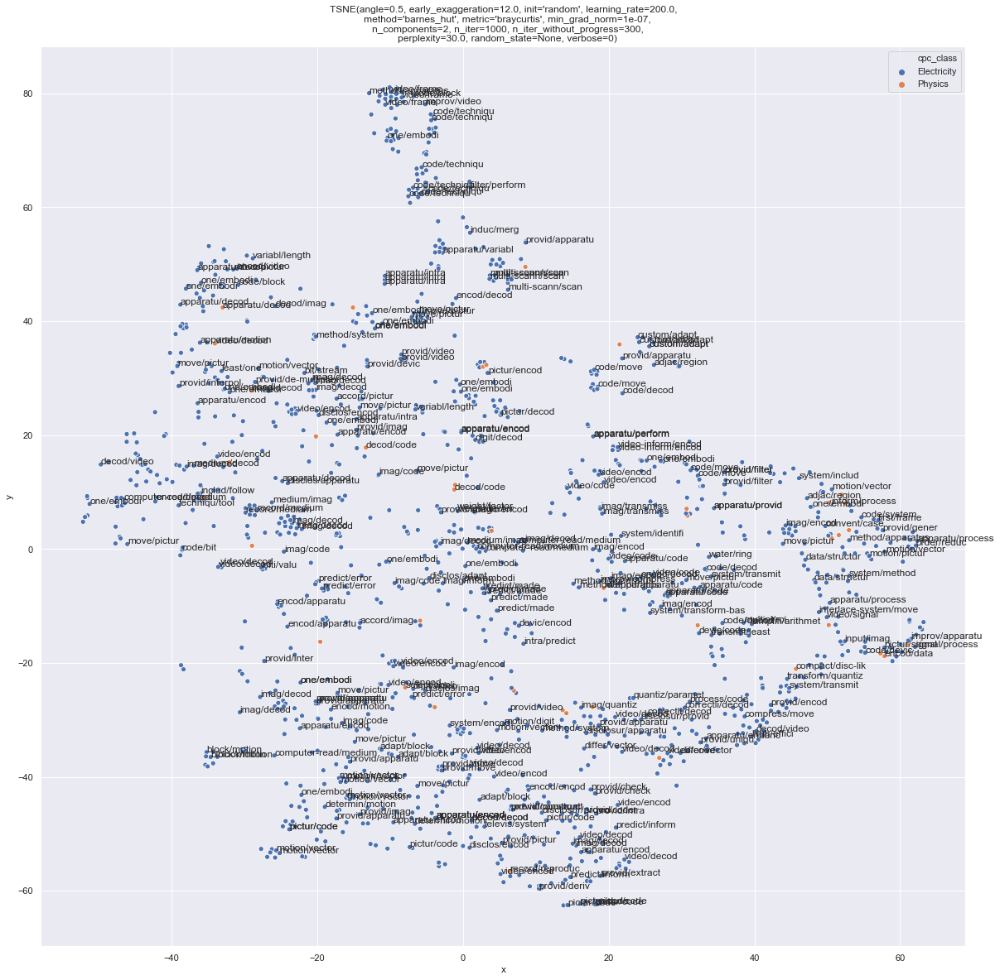

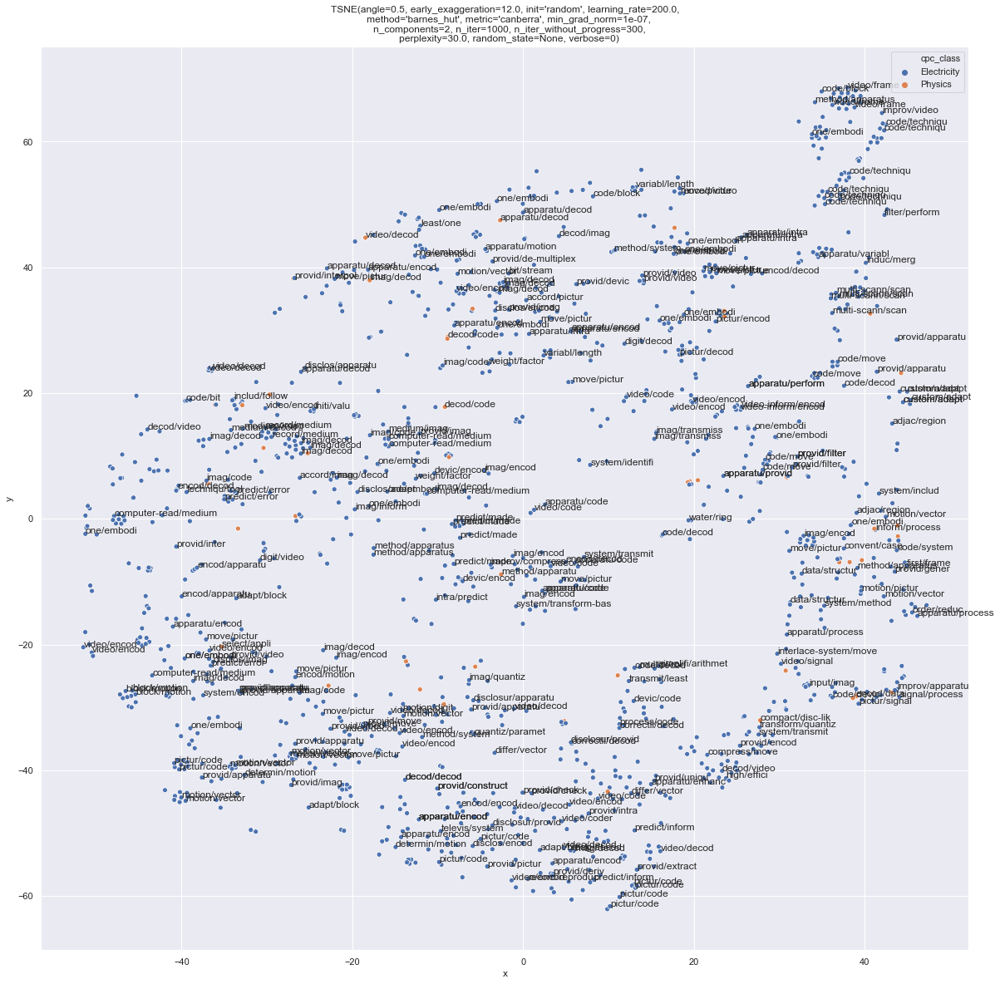

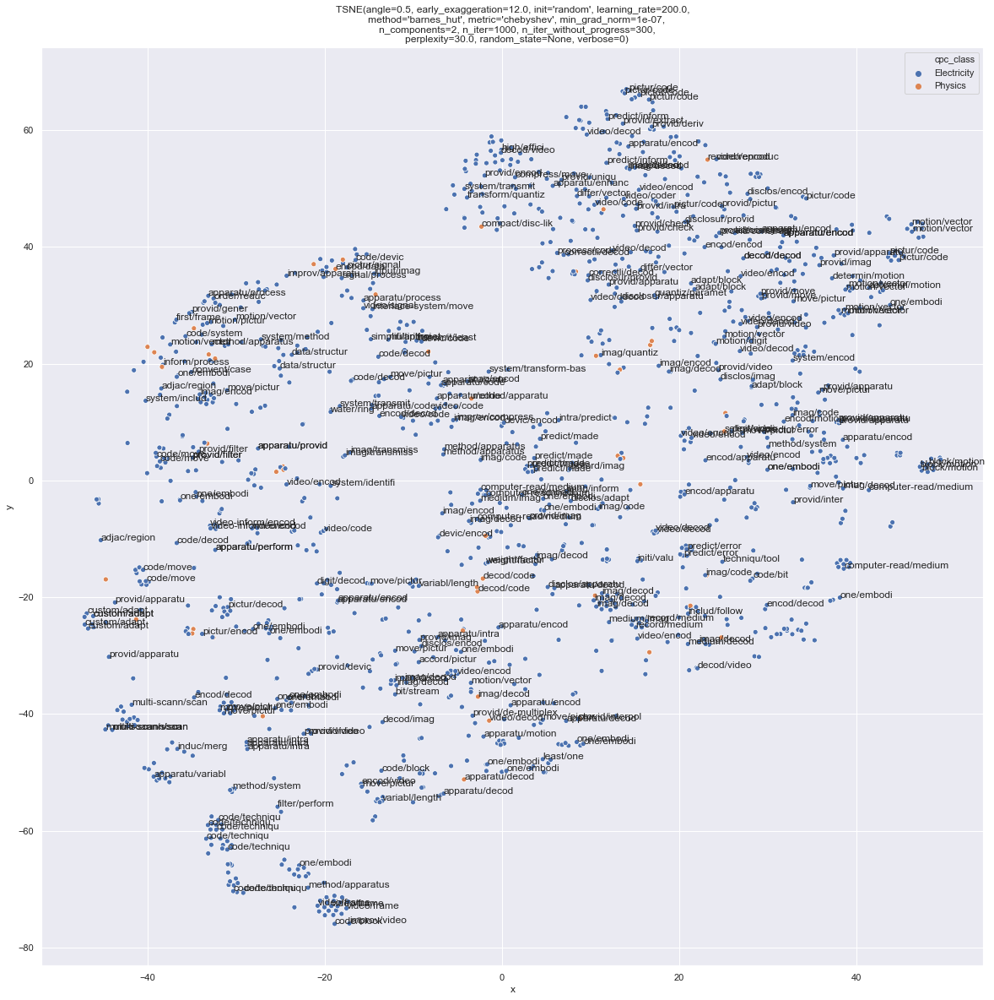

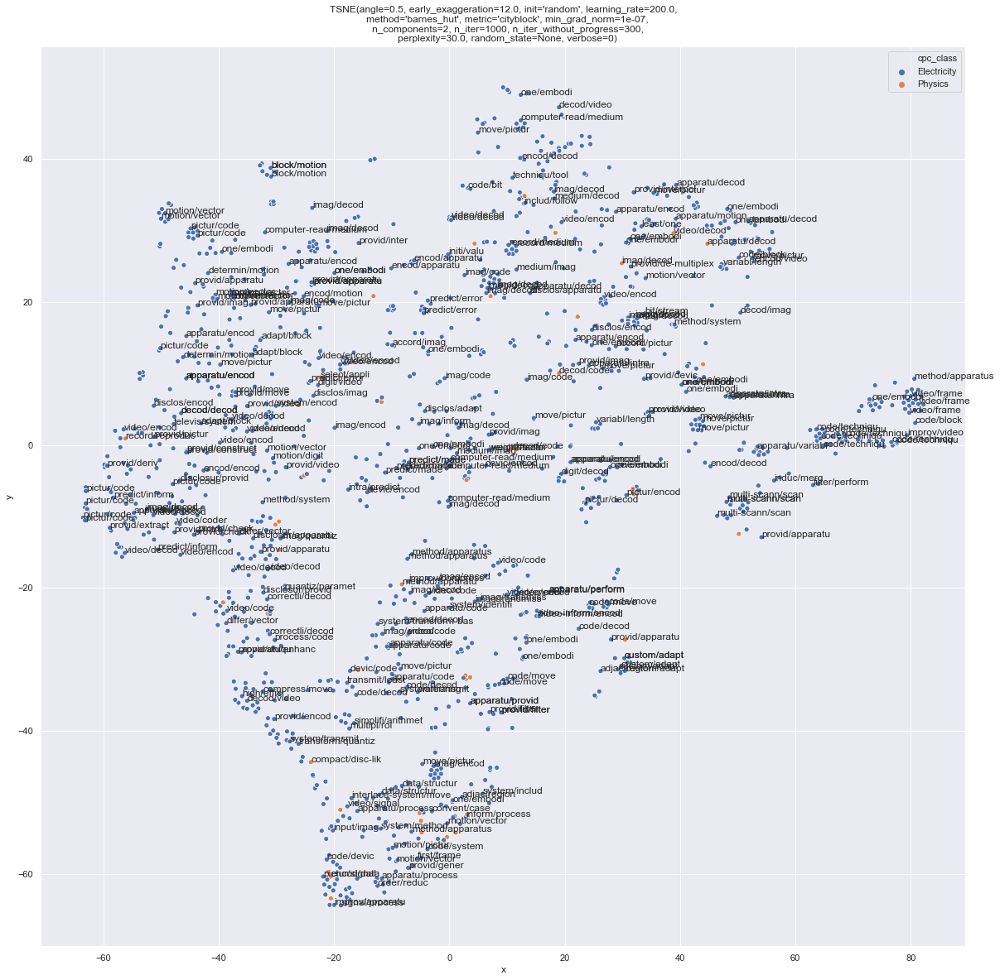

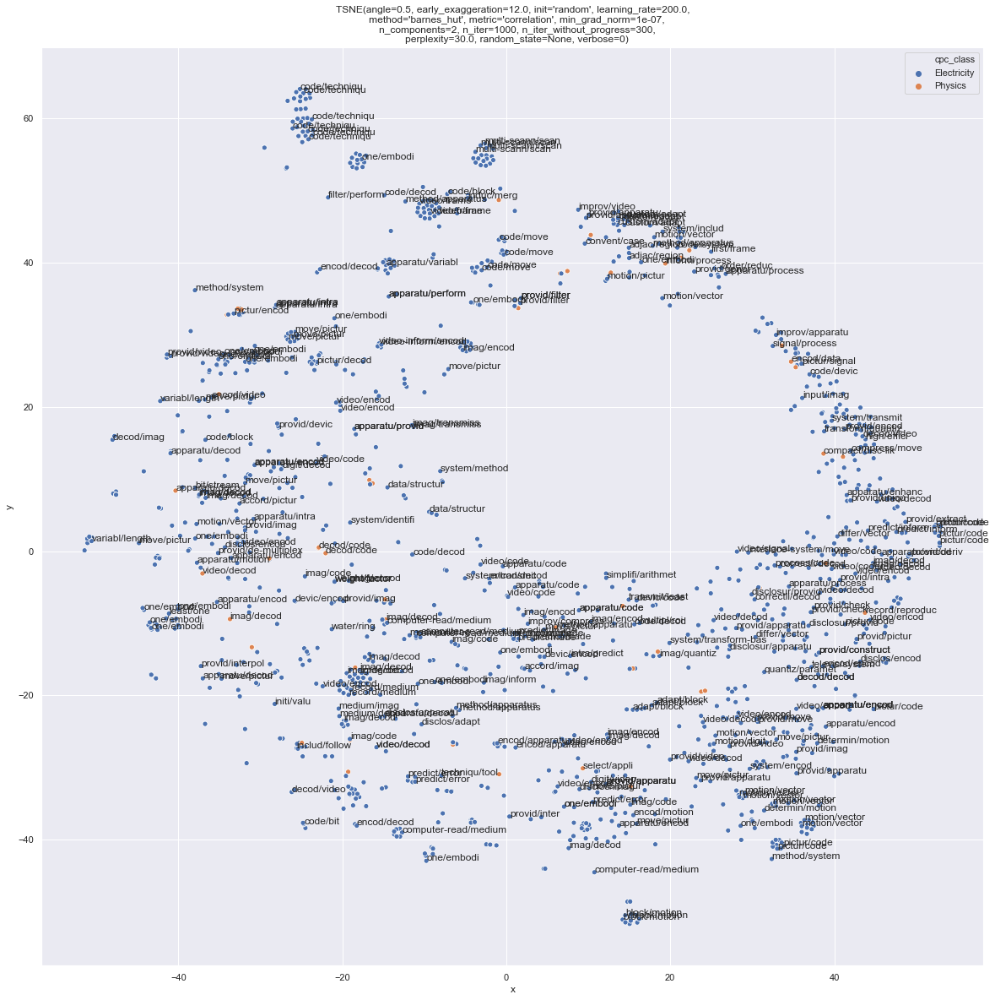

...

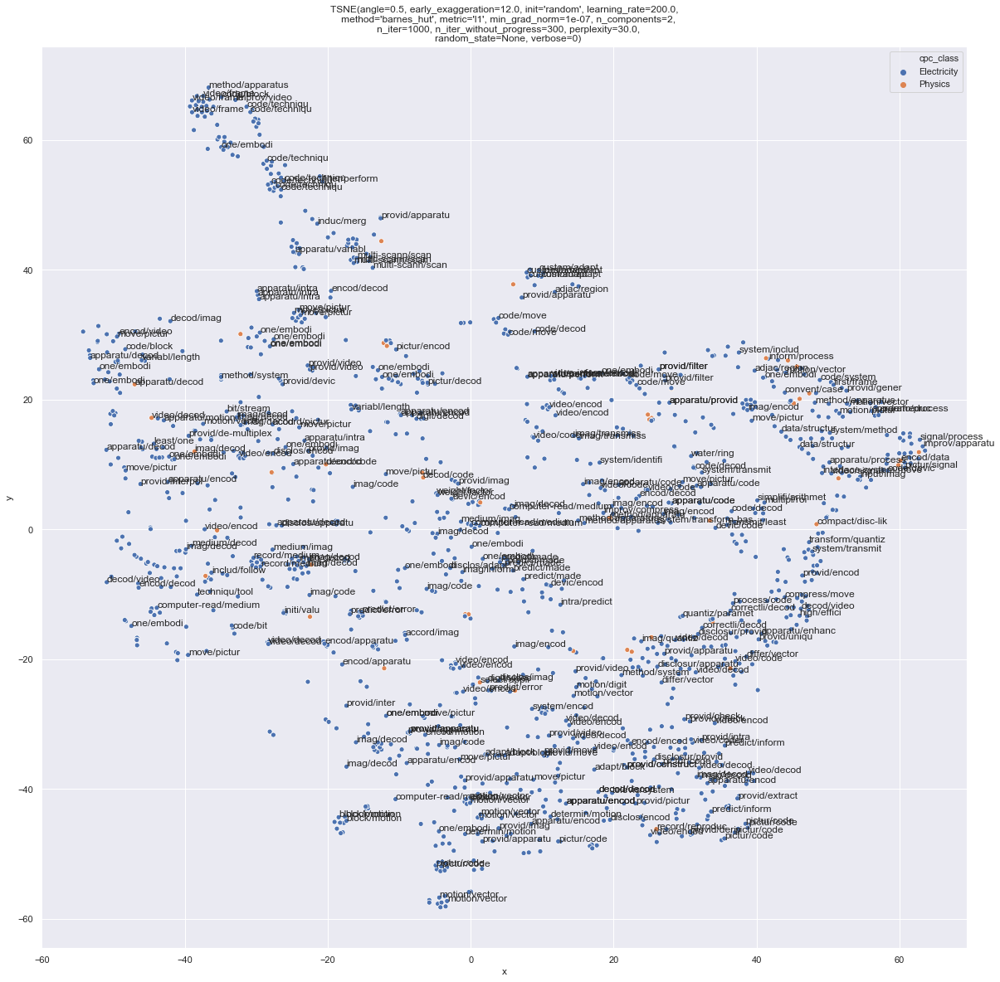

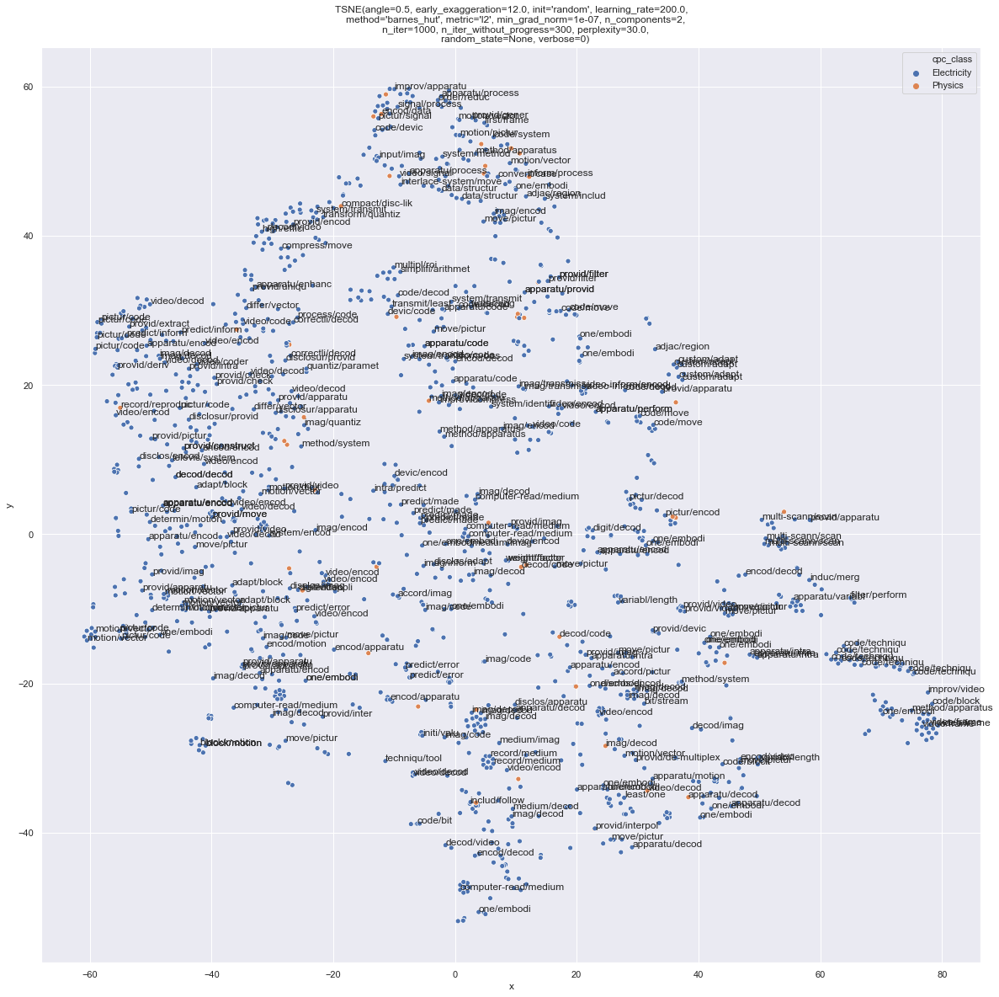

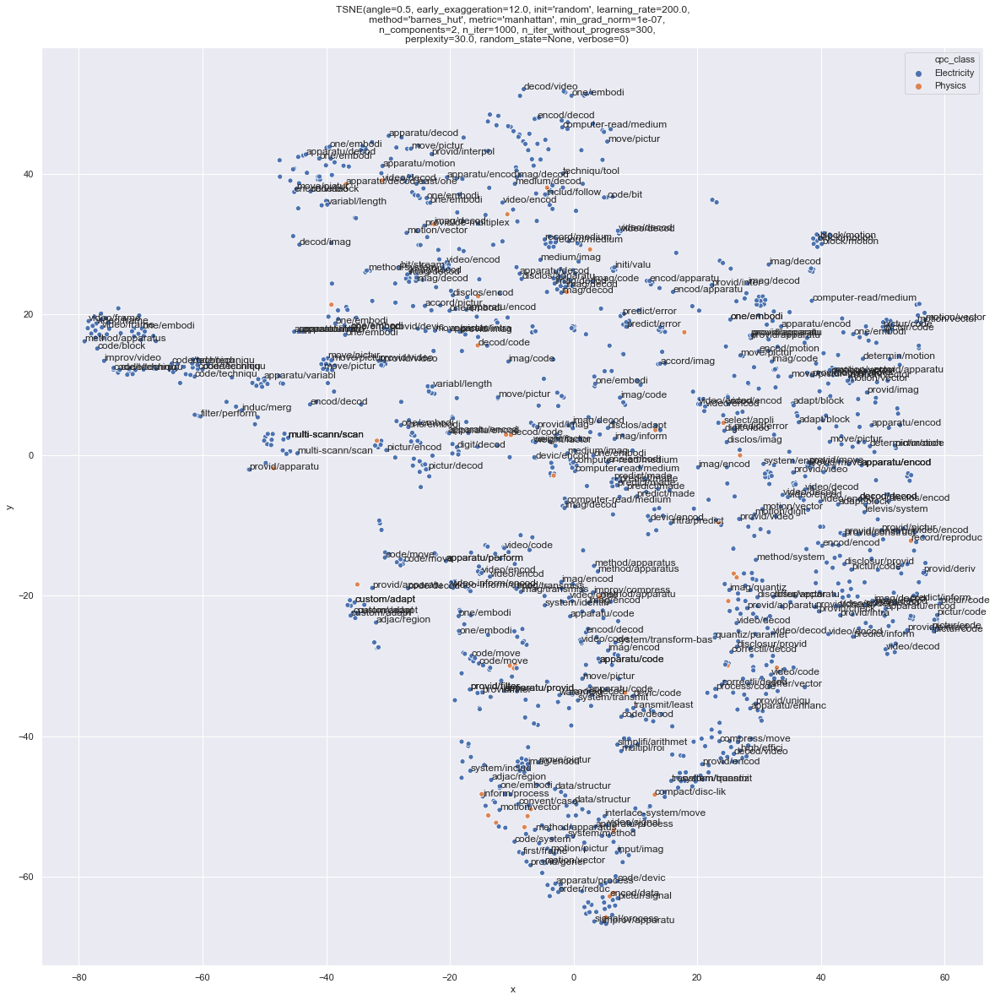

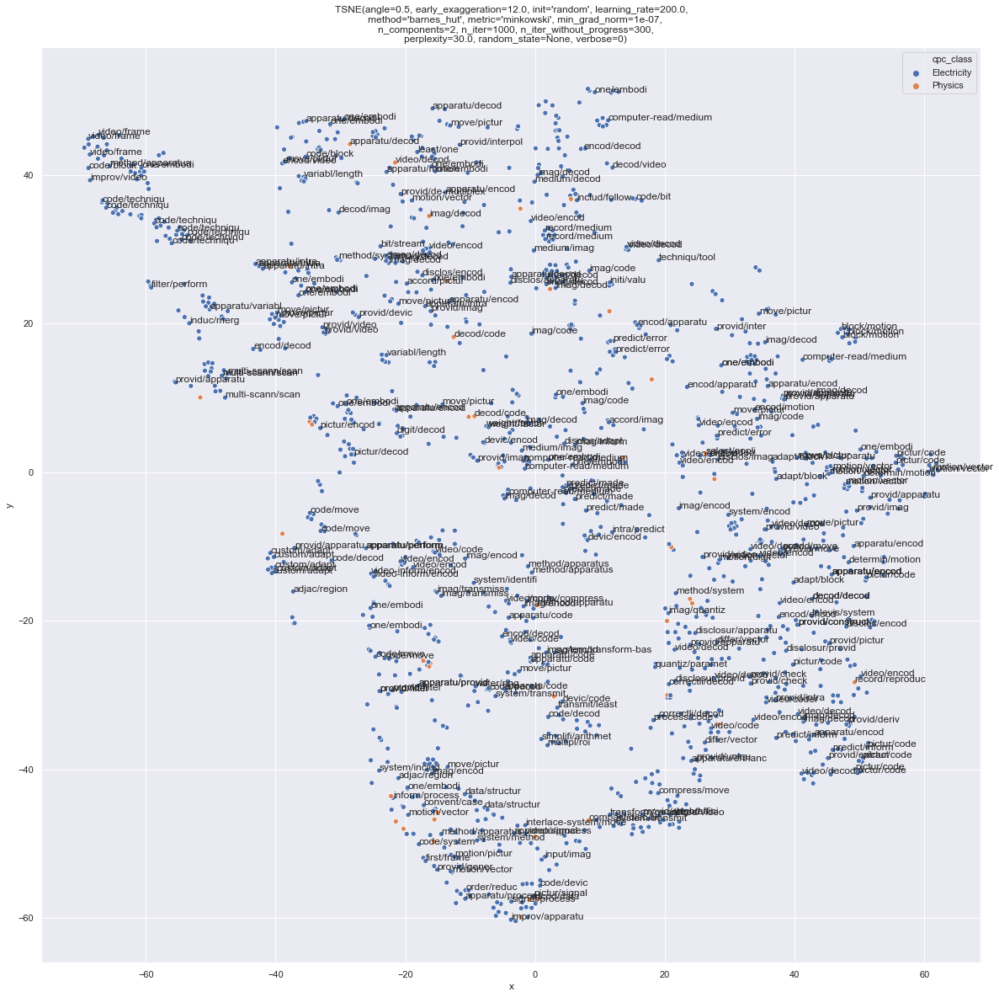

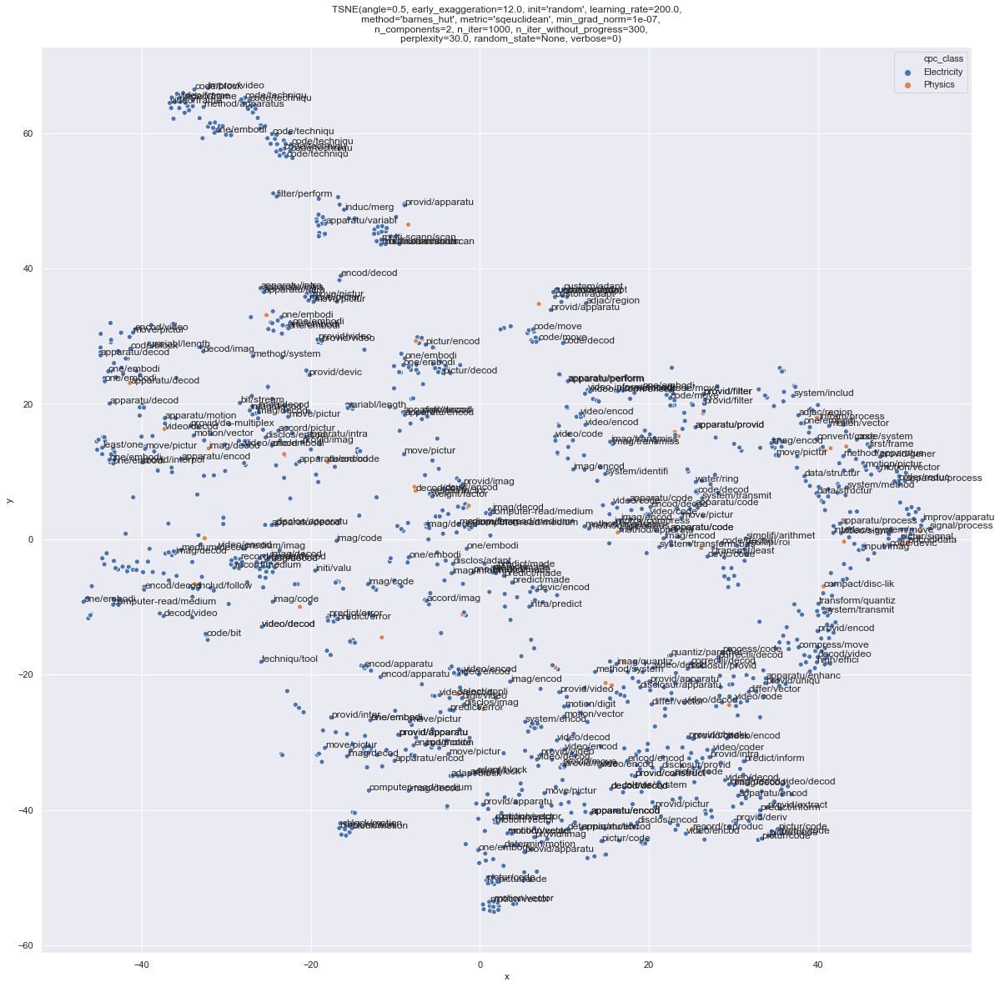

In [19]:
from sklearn.manifold import TSNE

for m in metrics:
    tsne = TSNE(metric=m)
    ev64 = EmbeddingVisualizer(tsne, final_layer_seed, patents_seed)
    ev64.plot_embeddings(detailed=True, density=5, terms=2)

### Averaged word embeddings

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='braycurtis', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized
Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='canberra', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized
Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='chebyshev', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized
Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='cityblock', min_

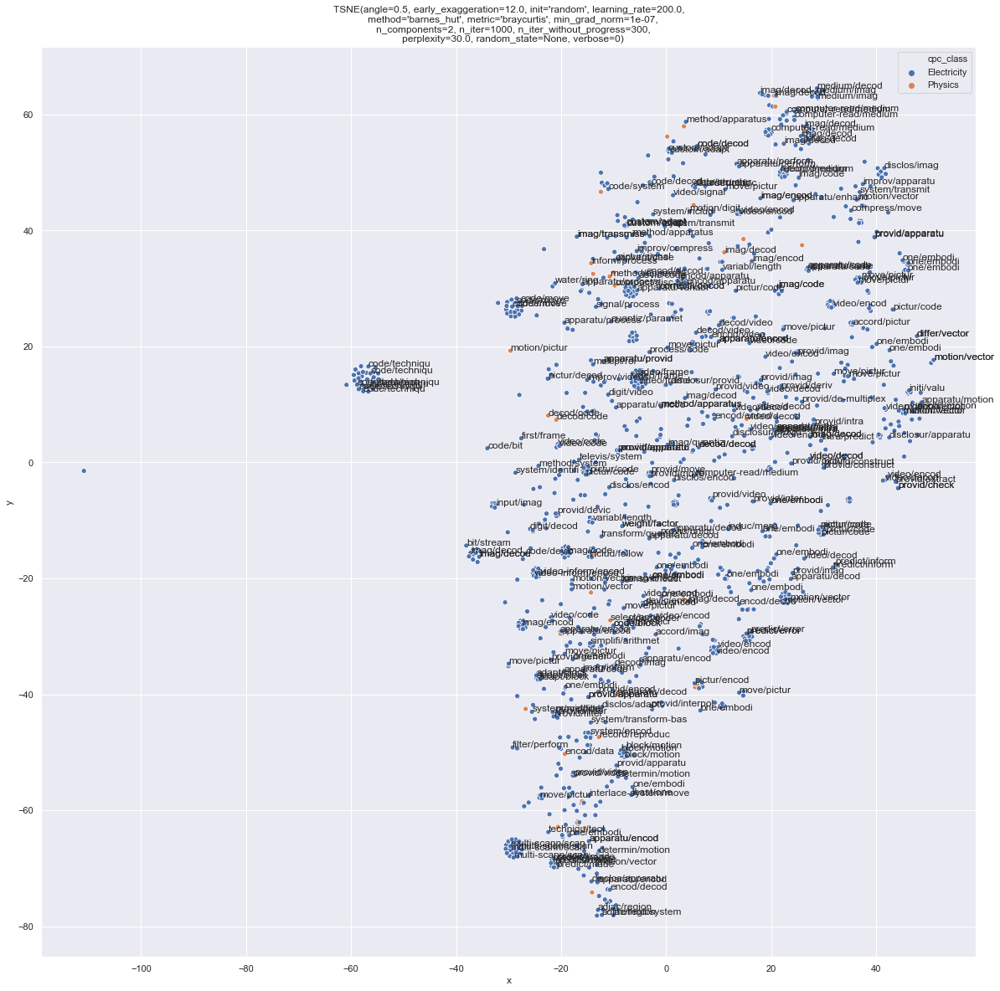

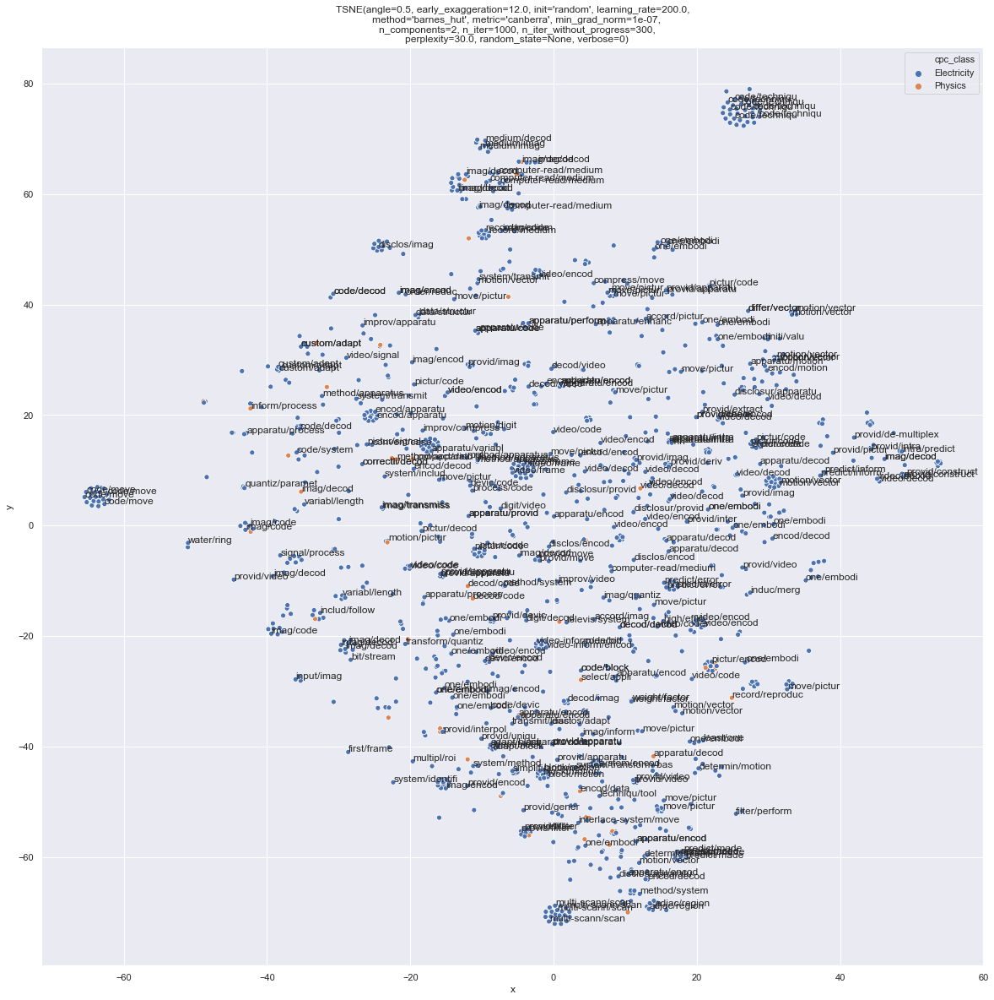

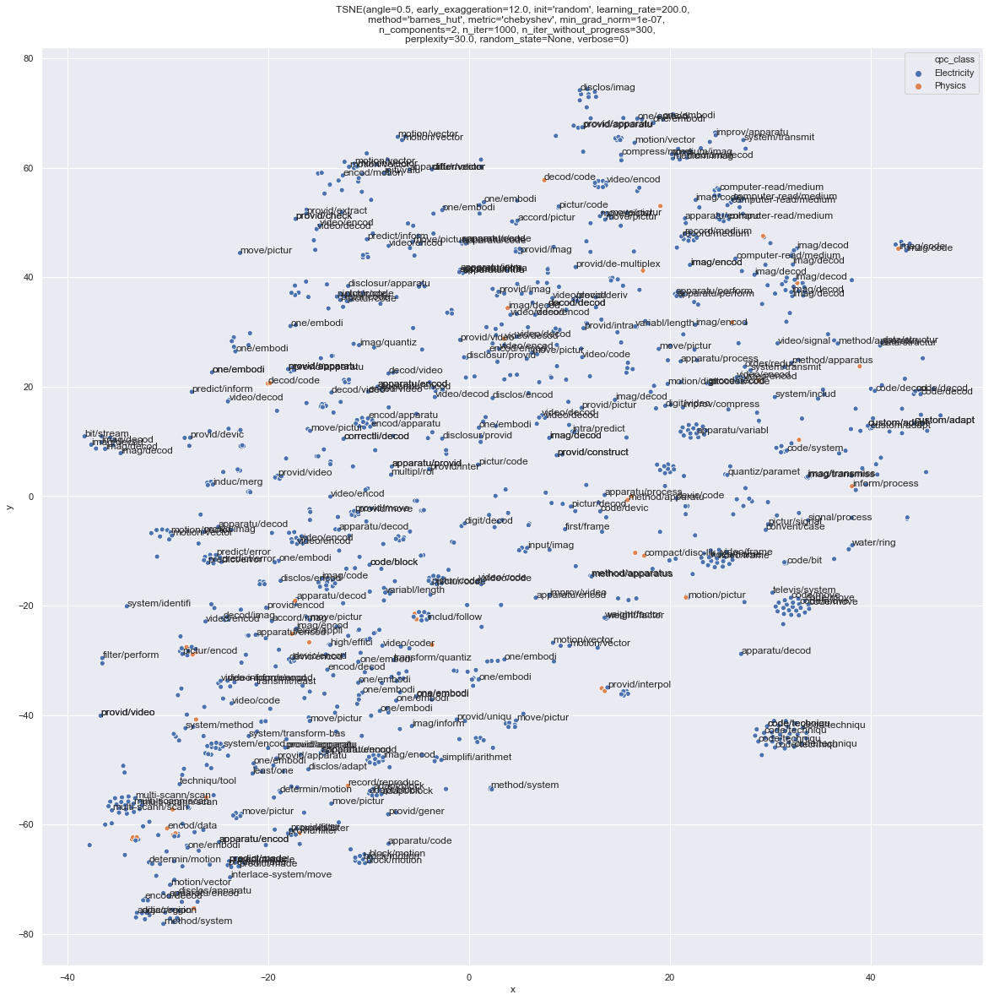

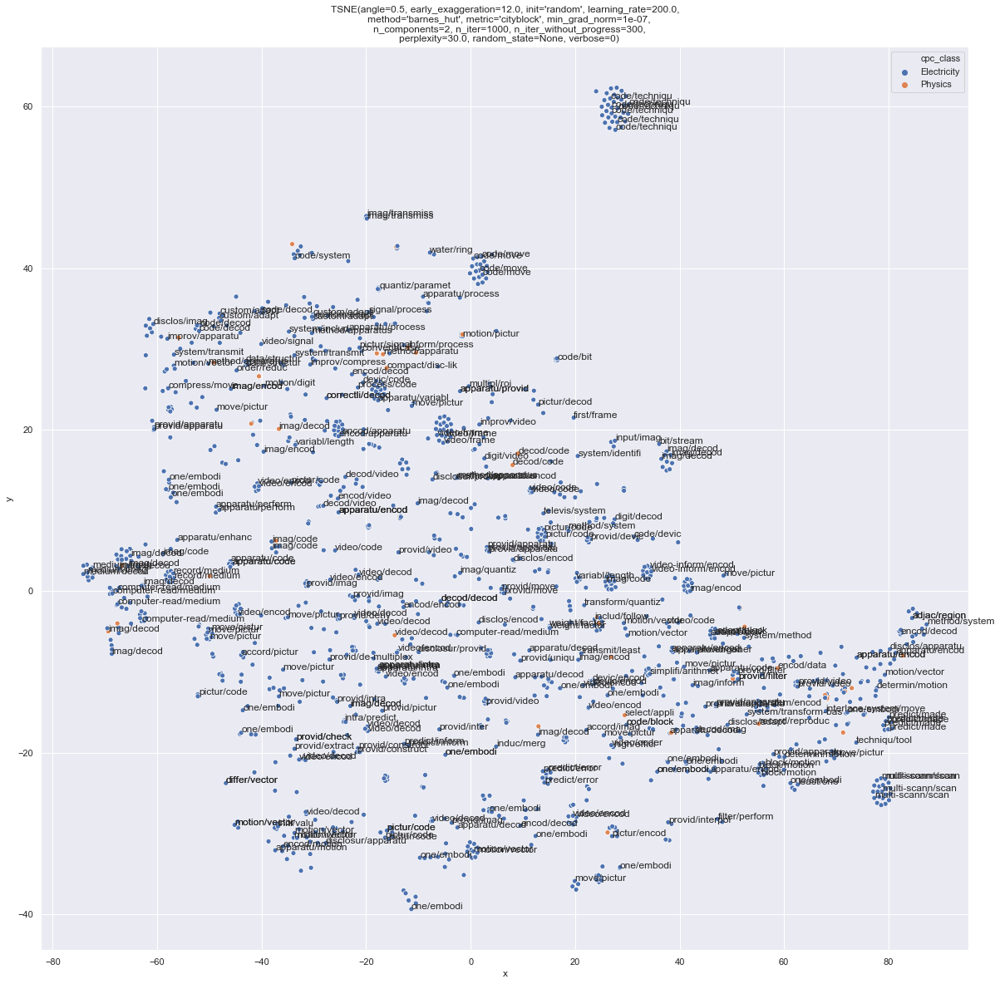

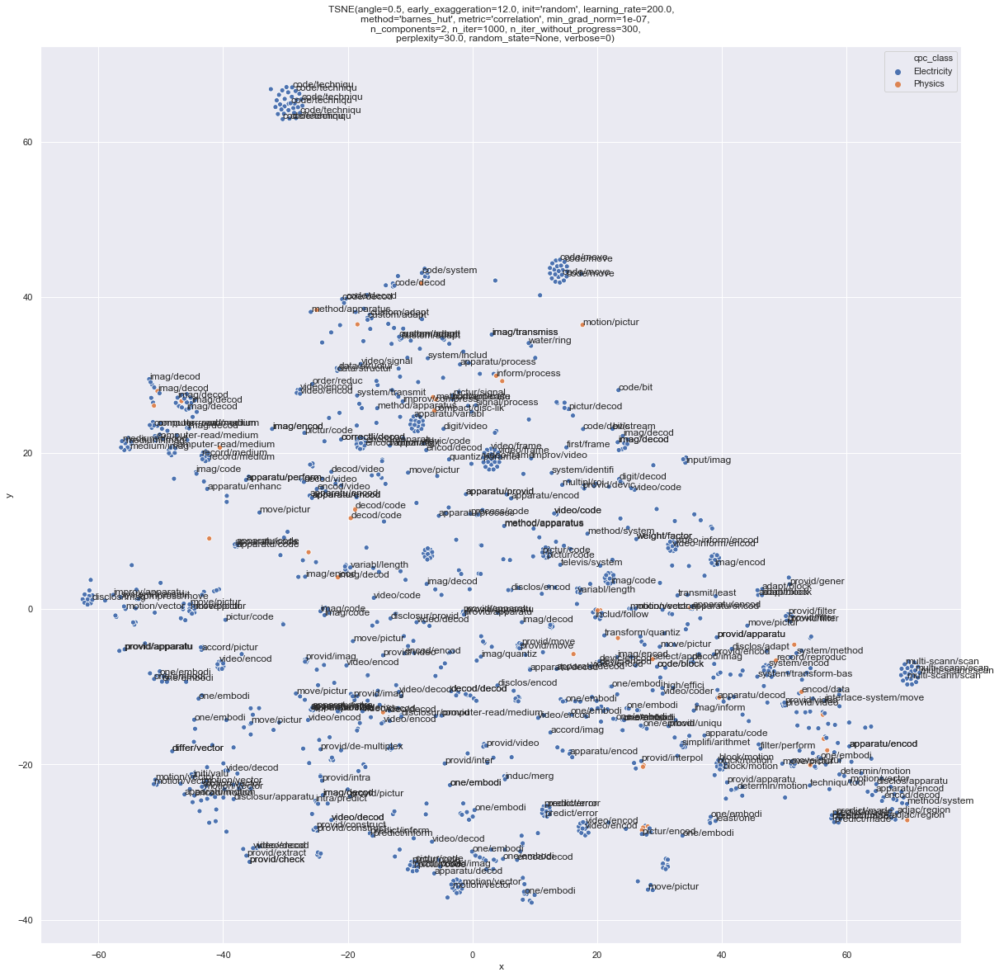

...

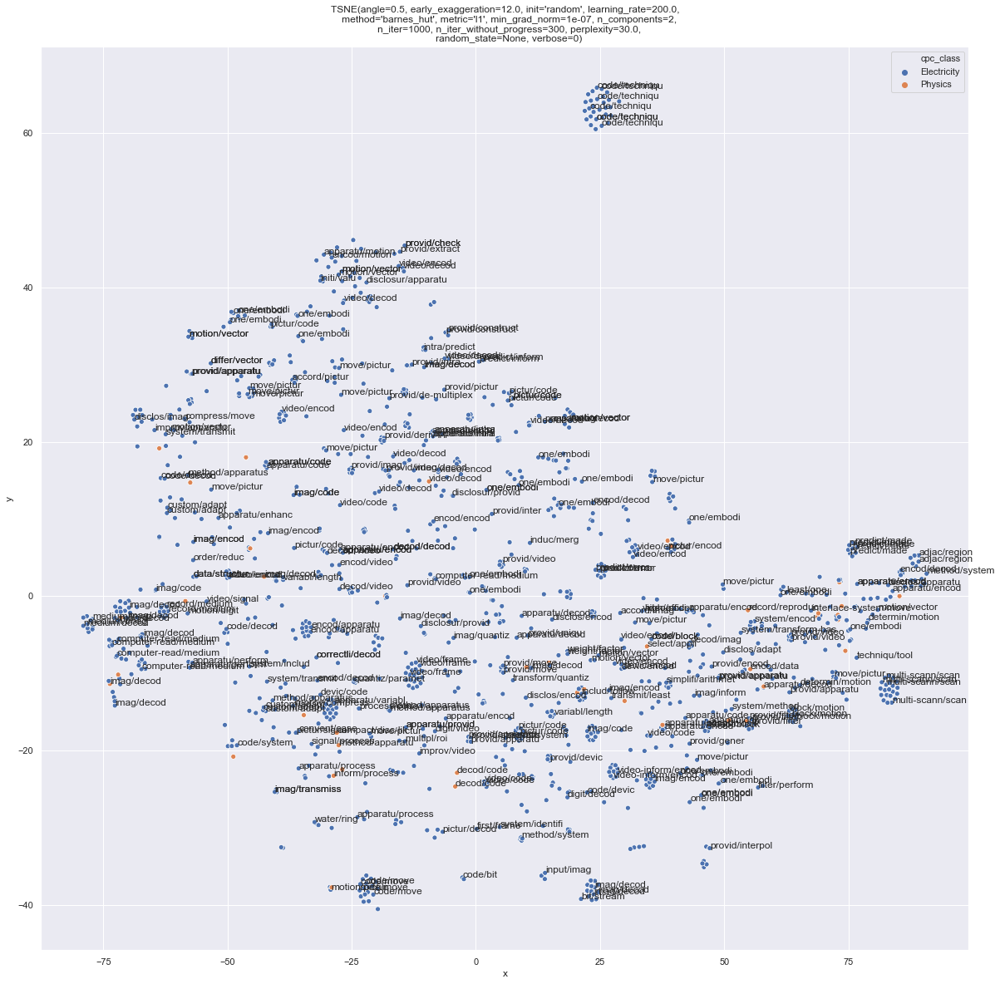

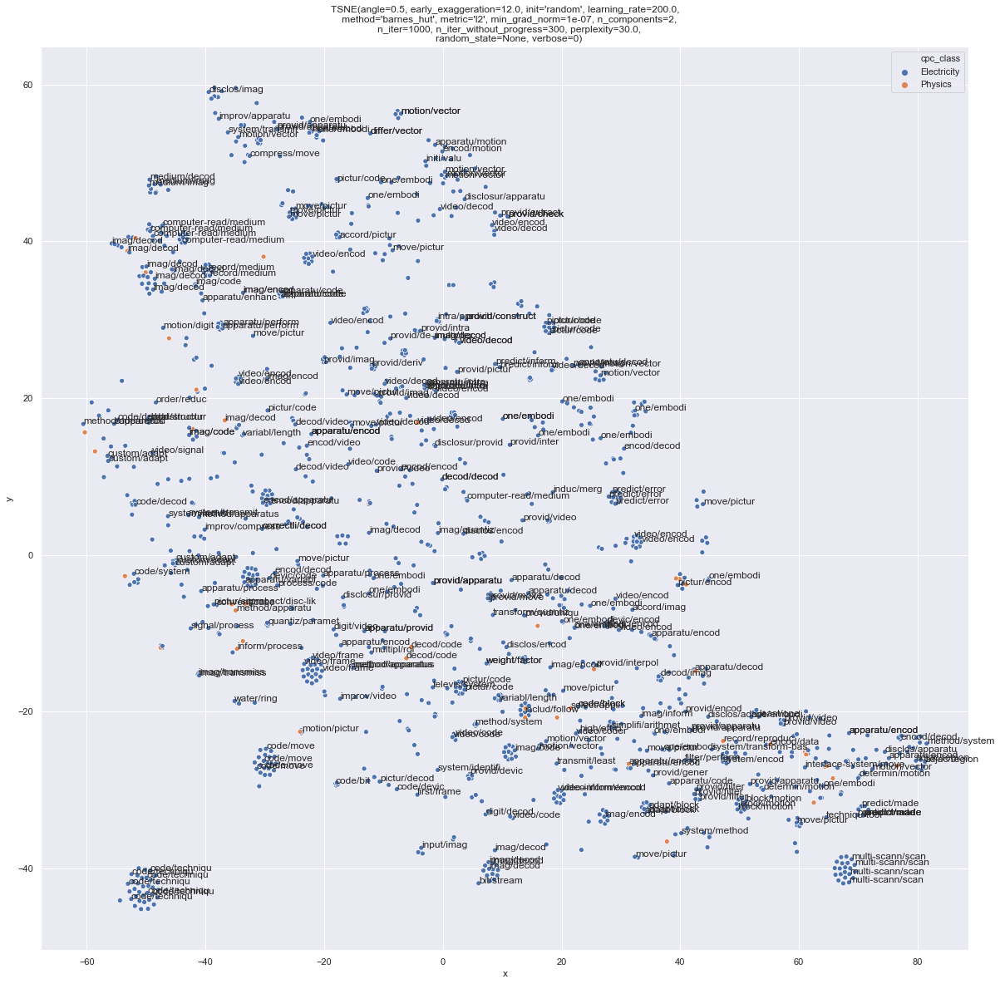

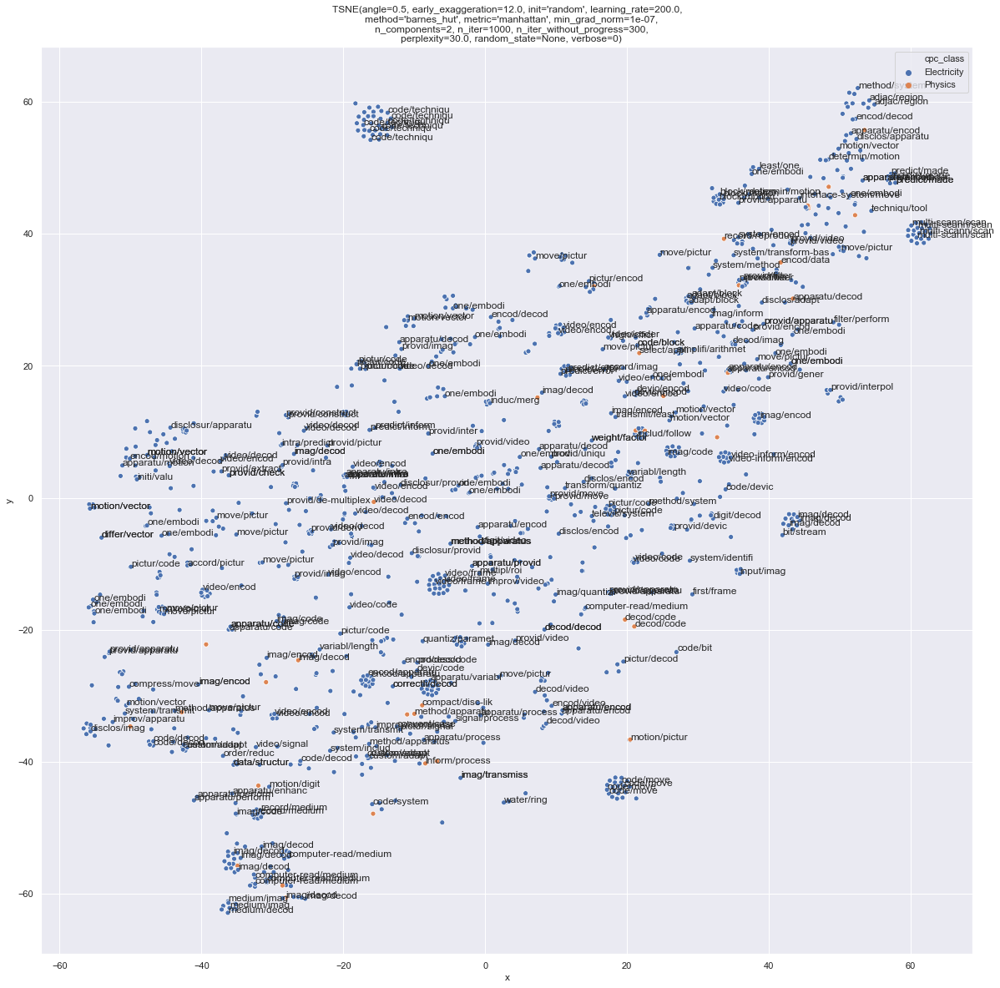

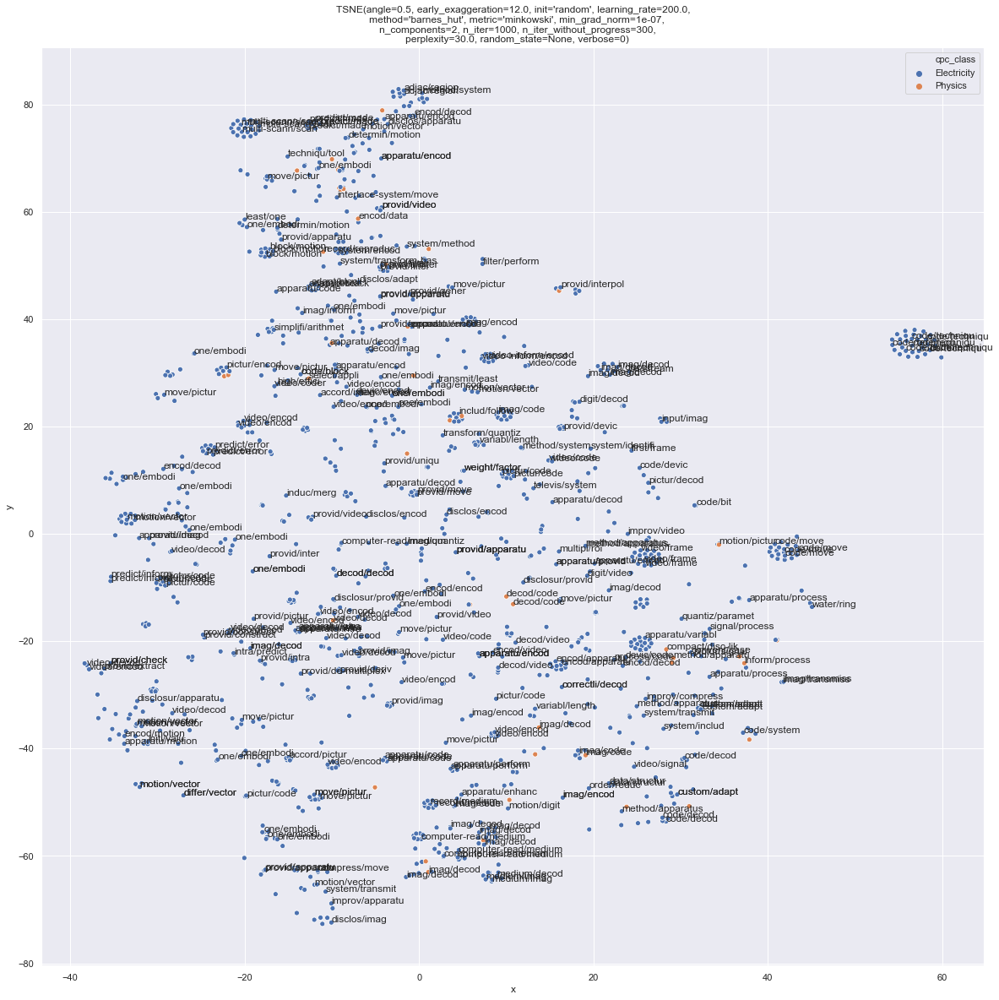

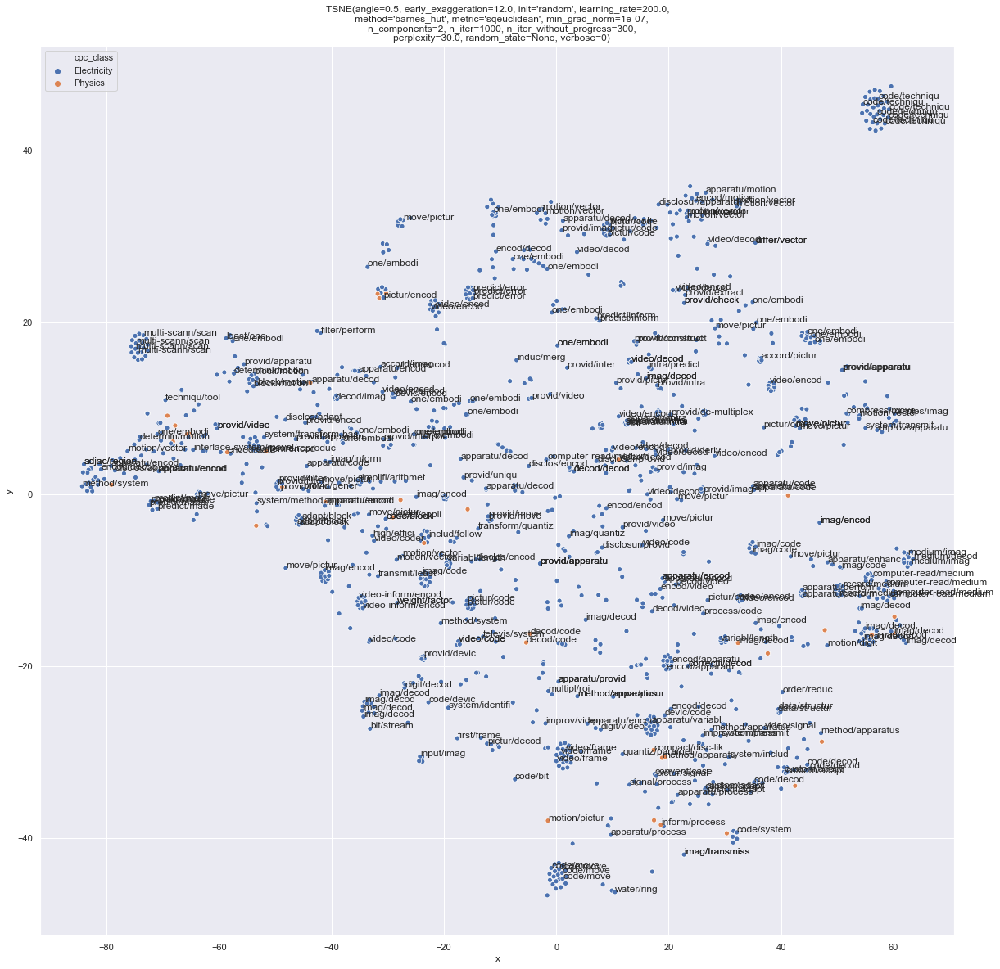

In [20]:
from sklearn.manifold import TSNE

for m in metrics:
    tsne = TSNE(metric=m)
    ev300 = EmbeddingVisualizer(tsne, average_word_seed, patents_seed)
    ev300.plot_embeddings(detailed=True, density=5, terms=2)